In [ ]:
#!unzip "/content/drive/MyDrive/Dog-vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog-vision/"

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/Dog-vision/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: /content/drive/MyDrive/Dog-vision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: /content/drive/MyDrive/Dog-vision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: /content/drive/MyDrive/Dog-vision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: /content/drive/MyDrive/Dog-vision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: /content/drive/MyDrive/Dog-vision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: /content/drive/MyDrive/Dog-vision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: /content/drive/MyDrive/Dog-vision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: /content/drive/MyDrive/Dog-vision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: /content/drive/MyDrive/Dog-vision/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: /content/drive/M

from io import BufferedReader
#End-to -end multi class Dog Breed classification
using Tensorflow 2.17.1

# 1. Problem
  Identify the breed of the dog from the given Image.

# 2. Data
  We're using data from kaggle's dog breed identification competition.

# 3. Evaluation
  The evaluation is a file that contains probability of each dog breed for each test image.

# 4. Features
  * The data have 120 different dog breeds
  * We've around 10,000+ images in train set.
  * We've around 10,000+ images in test set.

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print("TF version", tf.__version__)
print("Hub version", hub.__version__)

print("GPU", "available (YESS!!)" if tf.config.list_physical_devices("GPU") else ("not available:("))

TF version 2.18.0
Hub version 0.16.1
GPU available (YESS!!)


# Turning the data into Tensors

In [ ]:
import pandas as pd
label_csv = pd.read_csv("/content/drive/MyDrive/Dog-vision/labels.csv")
print(label_csv.describe())
print(label_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

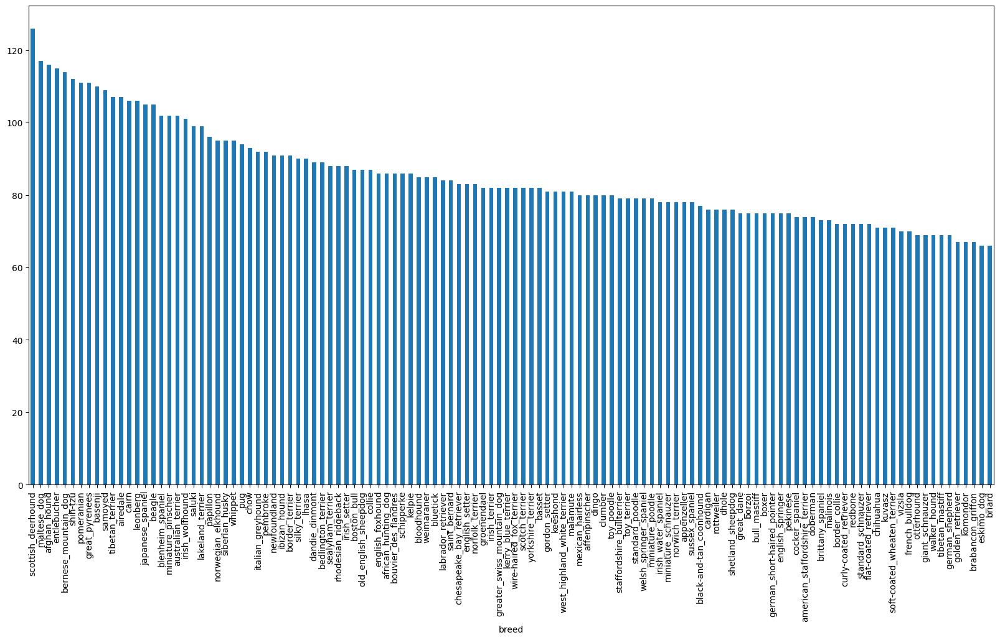

In [ ]:
label_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [ ]:
label_csv["breed"].value_counts().median()

82.0

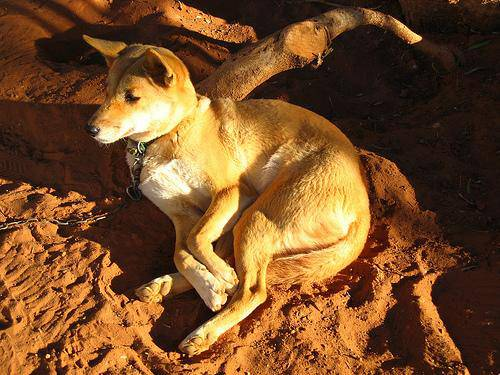

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/Dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

# Getting Images and their labels

In [ ]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
filenames=["/content/drive/MyDrive/Dog-vision/train/" + fname + ".jpg" for fname in label_csv['id']]
filenames[:10]

['/content/drive/MyDrive/Dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
if len(os.listdir("/content/drive/MyDrive/Dog-vision/train/")) == len(filenames):
  print("Filenames match actual amount of file . Proceed.")
else:
  print("Filenames do not match the actual number of files. Check gthe atrget directory.")

Filenames do not match the actual number of files. Check gthe atrget directory.


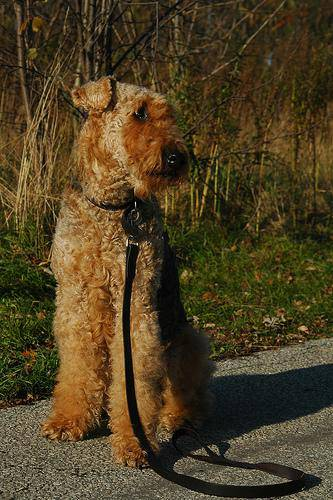

In [ ]:
Image(filenames[5000])

In [ ]:
label_csv["breed"][5000]

'airedale'

In [ ]:
import numpy as np
labels = label_csv["breed"].to_numpy()
#labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
if len(labels)== len(filenames):
  print("Number of labels matches the number of filenames")
else:
  print("Number of labels does not matches the number of filenames , check the data dictionaries")

Number of labels matches the number of filenames


In [ ]:

unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:

print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels= [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:

len(boolean_labels)

10222

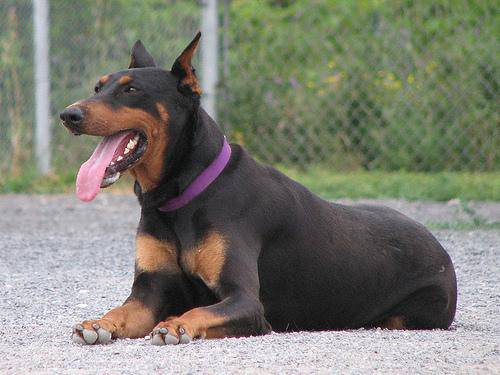

In [ ]:
Image(filenames[20])

In [ ]:

print(labels[20])
print(np.where(unique_breeds== labels[20]))
print(boolean_labels[20].argmax())
print(boolean_labels[20].astype(int))

doberman
(array([38]),)
38
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


# Creating our own validation set

In [ ]:

# Setting X & y variables
X= filenames
y= boolean_labels

In [ ]:
len(filenames)

10222

In [ ]:

#Start with ~1000 images and increase as per need
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000 , step:1000}

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val =train_test_split(X[:NUM_IMAGES],
                                                 y[:NUM_IMAGES],
                                                 test_size=0.2,
                                                 random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
X_train[:2], y_train[:2]

(['/content/drive/MyDrive/Dog-vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog-vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False,

## Preprocessing Images(Images into tensors)

In [ ]:
from matplotlib.pyplot import imread
image= imread(filenames[30])
image.shape

(338, 450, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[171, 115,  78],
        [170, 114,  77],
        [168, 114,  76],
        ...,
        [190, 167,  91],
        [190, 168,  93],
        [188, 169,  93]],

       [[172, 116,  79],
        [171, 115,  78],
        [169, 115,  77],
        ...,
        [195, 171,  97],
        [195, 173,  98],
        [193, 174,  98]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 450, 3), dtype=uint8, numpy=
array([[[171, 115,  78],
        [170, 114,  77],
        [168, 114,  76],
        ...,
        [190, 167,  91],
        [190, 168,  93],
        [188, 169,  93]],

       [[172, 116,  79],
        [171, 115,  78],
        [169, 115,  77],
        ...,
        [195, 171,  97],
        [195, 173,  98],
        [193, 174,  98]]], dtype=uint8)>

In [ ]:
IMG_SIZE = 224
def process_image(image_path, img_size=IMG_SIZE):
   #read the image file
   image= tf.io.read_file(image_path)
   #turn the jpeg to numerical tensor with three color channels
   image= tf.image.decode_jpeg(image, channels=3)
   #turn the color channel values from 0-255 to 0-1 values
   image = tf.image.convert_image_dtype(image, tf.float32)
   #Resize the image
   image = tf.image.resize(image, size=[img_size,img_size])

   return image

In [ ]:
image_path = filenames[40]

image = tf.io.read_file(image_path)
image

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01%\x01\x90\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
image= tf.image.decode_jpeg(image, channels=3)
image

<tf.Tensor: shape=(293, 400, 3), dtype=uint8, numpy=
array([[[255, 248, 248],
        [252, 238, 238],
        [250, 239, 237],
        ...,
        [112, 164,  89],
        [ 98, 152,  77],
        [ 93, 146,  74]],

       [[255, 250, 245],
        [255, 252, 245],
        [254, 247, 239],
        ...,
        [ 96, 148,  73],
        [ 87, 139,  67],
        [ 89, 142,  70]],

       [[235, 238, 219],
        [242, 245, 224],
        [229, 232, 211],
        ...,
        [ 85, 137,  62],
        [ 84, 136,  64],
        [ 94, 145,  76]],

       ...,

       [[122, 140,  78],
        [116, 137,  78],
        [119, 146,  95],
        ...,
        [122, 143, 102],
        [141, 162, 123],
        [179, 201, 163]],

       [[111, 129,  67],
        [110, 131,  72],
        [117, 144,  93],
        ...,
        [120, 141, 100],
        [136, 157, 118],
        [169, 191, 153]],

       [[103, 122,  58],
        [102, 124,  62],
        [110, 137,  84],
        ...,
        [119, 140,  9

In [ ]:

image= tf.image.convert_image_dtype(image, tf.float32)
image

<tf.Tensor: shape=(293, 400, 3), dtype=float32, numpy=
array([[[1.        , 0.9725491 , 0.9725491 ],
        [0.98823535, 0.9333334 , 0.9333334 ],
        [0.9803922 , 0.93725497, 0.9294118 ],
        ...,
        [0.43921572, 0.6431373 , 0.34901962],
        [0.38431376, 0.59607846, 0.3019608 ],
        [0.3647059 , 0.57254905, 0.2901961 ]],

       [[1.        , 0.9803922 , 0.9607844 ],
        [1.        , 0.98823535, 0.9607844 ],
        [0.9960785 , 0.9686275 , 0.93725497],
        ...,
        [0.37647063, 0.5803922 , 0.28627452],
        [0.34117648, 0.54509807, 0.2627451 ],
        [0.34901962, 0.5568628 , 0.27450982]],

       [[0.9215687 , 0.9333334 , 0.8588236 ],
        [0.9490197 , 0.9607844 , 0.87843144],
        [0.8980393 , 0.909804  , 0.82745105],
        ...,
        [0.33333334, 0.5372549 , 0.24313727],
        [0.32941177, 0.53333336, 0.2509804 ],
        [0.36862746, 0.5686275 , 0.29803923]],

       ...,

       [[0.4784314 , 0.54901963, 0.30588236],
        [0.45

## Turning our data into batches

In [ ]:
def get_image_label(image_path,label):
  image= process_image(image_path)
  return image, label

In [ ]:
(process_image(X[42]), y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:

#define teh batch size
BATCH_SIZE= 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch= data.map(process_image).batch(batch_size)
    return data_batch
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch=data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))
    #create (image, label) tuples and also preprocesses the data
    data =data.map(get_image_label)
    data_batch=data.batch(batch_size)

  return data_batch



In [ ]:

train_data= create_data_batches(X_train, y_train)
val_data= create_data_batches(X_val, y_val, valid_data=True)

Creating validation data batches...
Creating validation data batches...


In [ ]:

train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [ ]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):

  plt.figure(figsize=(10,10))

  for i in range(25):
    ax =plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.tight_layout()
    plt.axis("off")






In [ ]:
train_images, train_labels= next(train_data.as_numpy_iterator())

len(train_images), len(train_labels)

(32, 32)

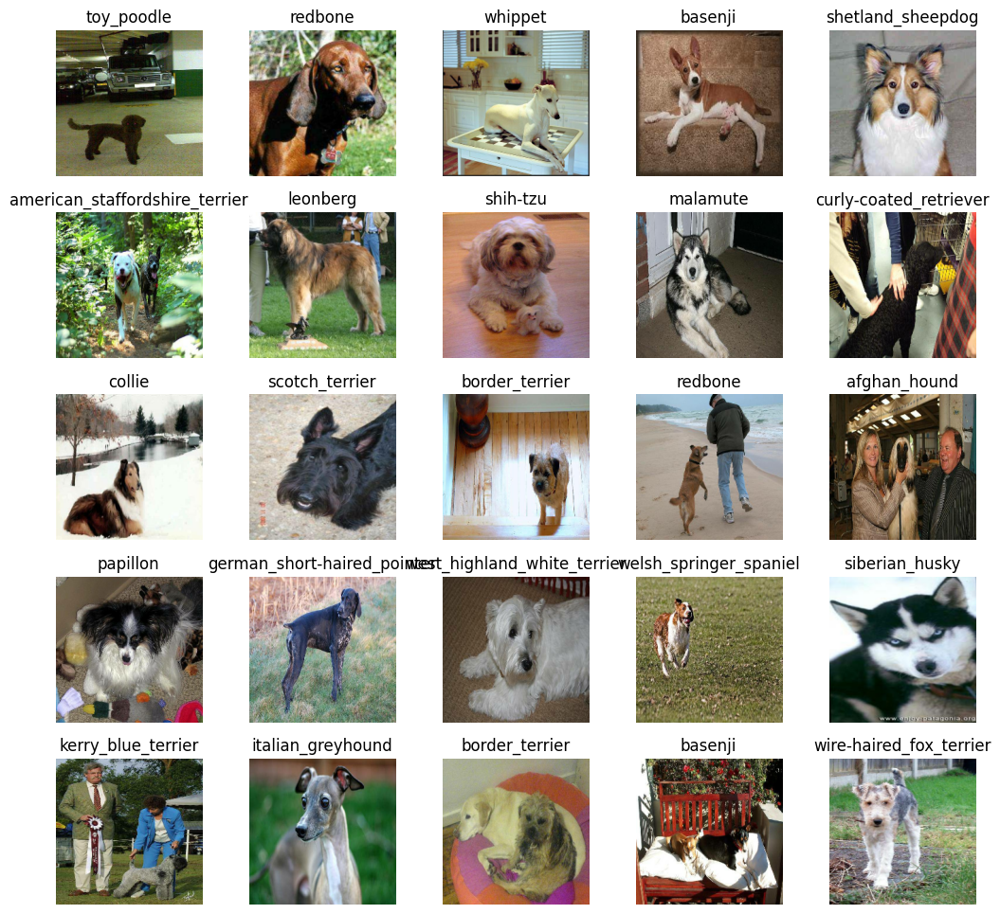

In [ ]:


show_25_images(train_images, train_labels)


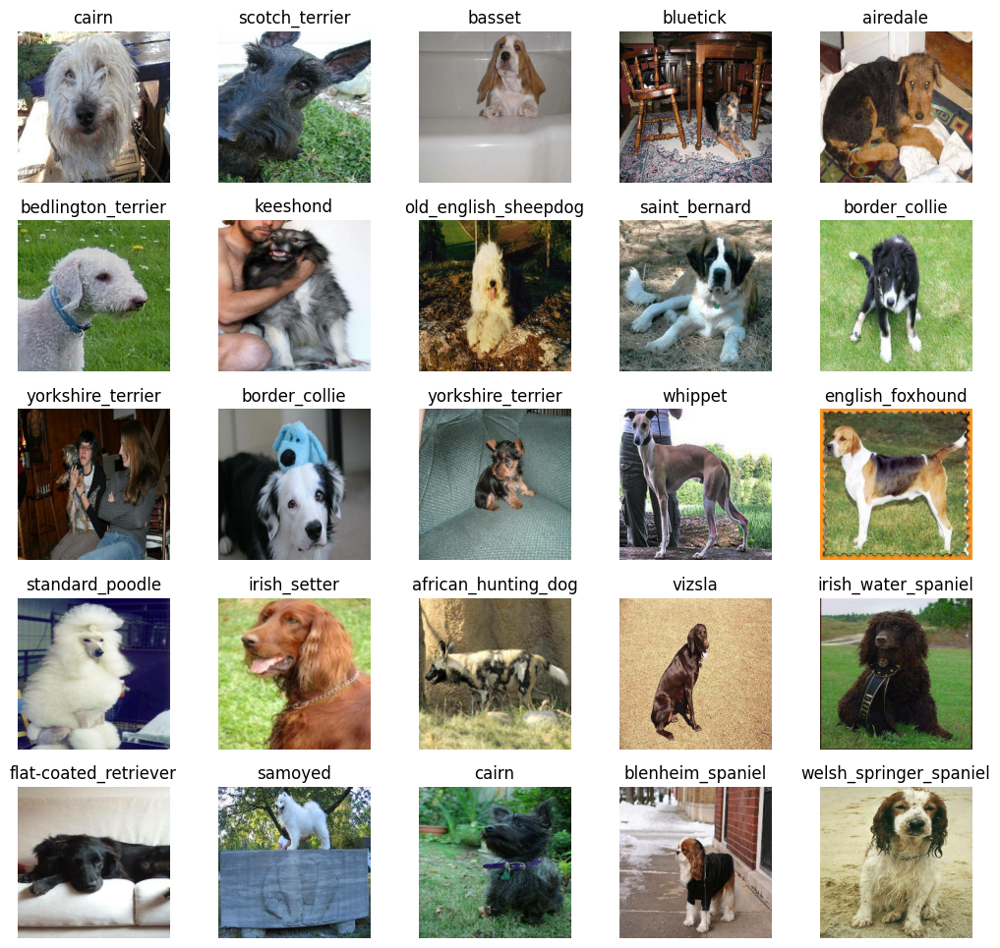

In [ ]:
val_images, val_labels= next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)


## Building a model
Before building the model we need to define:
* The input shape to our model.
* The output shape to our model.
* The URL ogf the model we want to use.

In [ ]:

INPUT_SHAPE = [None,IMG_SIZE, IMG_SIZE, 3 ] #batch , h, w, colour channels

OUTPUT_SHAPE = len(unique_breeds)

MODEL_URL = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"


In [ ]:
# def create_model(input_shape= INPUT_SHAPE, output_shape= OUTPUT_SHAPE, model_url= MODEL_URL):

#   print("Building model with:", MODEL_URL)

#   model= tf.keras.Sequential([
#       hub.KerasLayer(MODEL_URL),
#       tf.keras.layers.Dense(units=OUTPUT_SHAPE,
#                             activation="softmax")
#   ])

#   #Compile model

#   model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
#                 optimizer=tf.keras.optimizers.Adam(),
#                 metrics=["accuracy"])

#   model.build(INPUT_SHAPE)

#   return model

# model = create_model()
# model.summary()
# Use TF Hub's MobileNetV2 with proper preprocessing
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model

# Constants
INPUT_SHAPE = (224, 224, 3)  # MobileNetV2's expected input
OUTPUT_SHAPE = 120  # Number of classes

# ----------------------------------------------
# Build Model with Preprocessing
# ----------------------------------------------
def build_model():
    # Load MobileNetV2 with pre-trained weights (no top)
    base_model = MobileNetV2(
        input_shape=INPUT_SHAPE,
        include_top=False,  # Remove the original classification layer
        weights='imagenet'
    )

    # Freeze base model
    base_model.trainable = False

    # Add new layers
    inputs = tf.keras.Input(shape=INPUT_SHAPE)
    x = base_model(inputs, training=False)
    x = GlobalAveragePooling2D()(x)
    outputs = Dense(OUTPUT_SHAPE, activation="softmax")(x)

    # Compile
    model = Model(inputs, outputs)
    model.compile(
        optimizer="adam",
        loss="categorical_crossentropy",
        metrics=["accuracy"]
    )
    return model

# Create and test
model = build_model()
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_2           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 120)                 │         153,720 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,411,704 (9.20 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

## Creating Callbacks


In [ ]:

%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime

def create_tensorboard_callbavks():
  logdir= os.path.join("/content/drive/MyDrive/Dog-vision/logs",
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
early_stopping= tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

In [ ]:
## Training on Subset of data(1000)

In [ ]:
NUM_EPOCHS= 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
def train_model():
  model= build_model()

  tensorboard= create_tensorboard_callbavks()

  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model



In [ ]:
model= train_model()

Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 220s 9s/step - accuracy: 0.0501 - loss: 4.8209 - val_accuracy: 0.2650 - val_loss: 3.5562
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - accuracy: 0.6192 - loss: 2.1893 - val_accuracy: 0.4400 - val_loss: 2.4244
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 188ms/step - accuracy: 0.9012 - loss: 0.9569 - val_accuracy: 0.5400 - val_loss: 1.9563
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 174ms/step - accuracy: 0.9786 - loss: 0.4935 - val_accuracy: 0.5800 - val_loss: 1.7776
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 193ms/step - accuracy: 0.9970 - loss: 0.3044 - val_accuracy: 0.5800 - val_loss: 1.6706
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 141ms/step - accuracy: 0.9990 - loss: 0.2080 - val_accuracy: 0.5800 - val_loss: 1.6031
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 138ms/step - accuracy: 1.0000 - loss: 0.1584 - val_accuracy: 0.5950 - val_loss: 1.5824
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 192ms/step - accuracy: 1.0000 - loss: 0.1129 - val_accur

In [ ]:
### Checking the tensorboard logs

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Dog-vision/logs

<IPython.core.display.Javascript object>

In [ ]:
## Making and evaluating predictions using trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
predictions =model.predict(val_data, verbose=1)

predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 536ms/step


array([[1.42578920e-03, 2.38740491e-03, 1.58671173e-04, ...,
        1.45806334e-04, 1.14640905e-04, 7.18744984e-03],
       [1.70863656e-04, 7.87191791e-04, 2.08630902e-03, ...,
        6.59471625e-05, 2.27993610e-03, 2.07167192e-04],
       [1.71755983e-05, 2.81137181e-04, 7.10079330e-05, ...,
        2.11520310e-05, 3.92519469e-05, 4.91555198e-04],
       ...,
       [2.69500997e-05, 1.31823486e-04, 6.36979094e-05, ...,
        8.27854165e-05, 1.97498975e-05, 8.93530523e-05],
       [4.37167590e-04, 1.20612523e-04, 3.40173079e-04, ...,
        2.58694763e-05, 5.94792837e-05, 1.46397427e-02],
       [6.89025837e-05, 9.19235663e-06, 1.94110369e-04, ...,
        7.58953800e-04, 1.64725978e-04, 8.36039195e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
index= 87
print(predictions[index])
print(f"Max vaue(prob of predictions): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")


[9.02336033e-05 4.63712923e-02 9.66203879e-05 8.94355617e-05
 3.71503461e-06 2.72417801e-05 1.06073485e-05 3.32615571e-04
 2.84833019e-03 1.43710320e-04 4.24157828e-04 6.70234091e-04
 1.44653168e-04 3.51516483e-03 1.16606988e-03 6.52422823e-05
 3.64767257e-05 1.22131227e-04 3.61109129e-03 8.34101411e-06
 7.39307382e-07 1.82482727e-05 1.54575457e-06 6.87876218e-06
 7.76635497e-05 4.45384285e-06 3.87514183e-06 6.69729634e-05
 9.07263820e-05 3.30131617e-04 3.01508953e-06 2.72708968e-03
 2.48935283e-03 2.65079056e-04 2.17253692e-04 5.98592378e-05
 2.30689675e-05 1.40345001e-04 1.36694489e-05 8.04593961e-04
 1.60852950e-02 9.09367463e-06 1.67840553e-05 3.19319297e-05
 4.84232994e-04 5.68187772e-07 1.43944535e-05 7.95097207e-04
 1.75220666e-05 2.20842674e-01 1.47726538e-03 2.15477830e-05
 1.97610855e-02 4.15031354e-06 6.76203626e-06 9.53974632e-06
 8.98698694e-04 6.39501886e-05 4.55228692e-05 1.79696782e-03
 7.30341300e-04 7.02291391e-06 3.21747780e-06 1.48069048e-05
 1.75885077e-06 2.053620

In [ ]:
#Note : prediction probabilities are also called confidence label

In [ ]:
def get_pred_label(pred_probabilities):
  """
  Turn a array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(pred_probabilities)]

pred_label= get_pred_label(predictions[56])
pred_label

# Create a function to unbatch a batch dataset

In [ ]:
def unbatchify(data):
   images = []
   labels = []

   for image, label in val_data.unbatch().as_numpy_iterator():
       images.append(image)
       labels.append(unique_breeds[np.argmax(label)])
   return images, labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
# images = []
# labels = []

# for image, label in val_data.unbatch.as_numpy_iterator():
#   images.append(image)
#   labels.append(label)

# images[0], labels[0]

Create a function that will take an array pf pred probabilities , an array of truth labels and an array of arrays and integers

In [ ]:

def plot_pred(pred_probabilities, labels , images, n=1):
  pred_prob, true_label, image= pred_probabilities[n], labels[n], images[n]

  pred_label= get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label ==true_label:
    color="green"
  else:
    color="red"

  plt.title("{} {:2.0f}%  {}".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label), color= color)

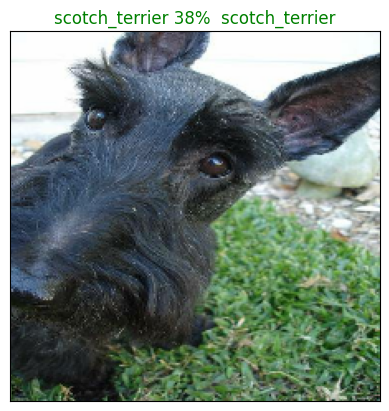

In [ ]:
plot_pred(pred_probabilities= predictions,
          labels=val_labels,
          images=val_images)

In [ ]:
def plot_pred_conf(pred_probabilities, labels, n=1):
  pred_prob, true_label= pred_probabilities[n], labels[n]

  pred_label= get_pred_label(pred_prob)

  top_10_pred_indexes= pred_prob.argsort()[-10:][::-1]

  top_10_pred_values= pred_prob[top_10_pred_indexes]
  top_10_pred_labels= np.array(unique_breeds)[top_10_pred_indexes]

  top_10_pred_labels= unique_breeds[top_10_pred_indexes]

  top_plot= plt.bar(np.arange(len(top_10_pred_labels)),
                    top_10_pred_values,
                    color= "grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels= top_10_pred_labels,
             rotation="vertical")

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

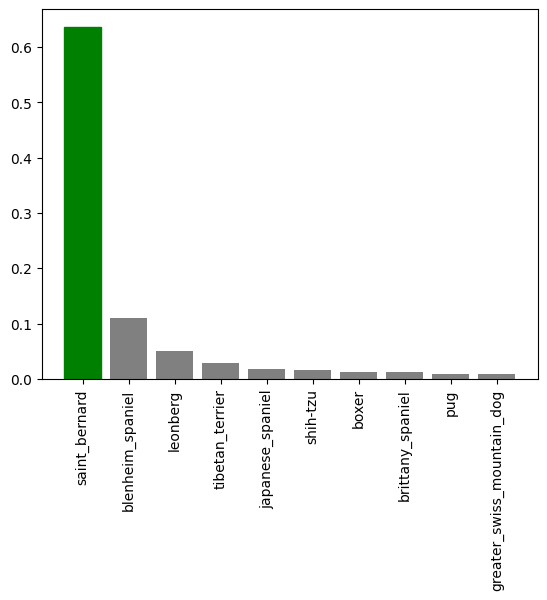

In [ ]:
plot_pred_conf(pred_probabilities= predictions,
              labels=val_labels,
               n=8)

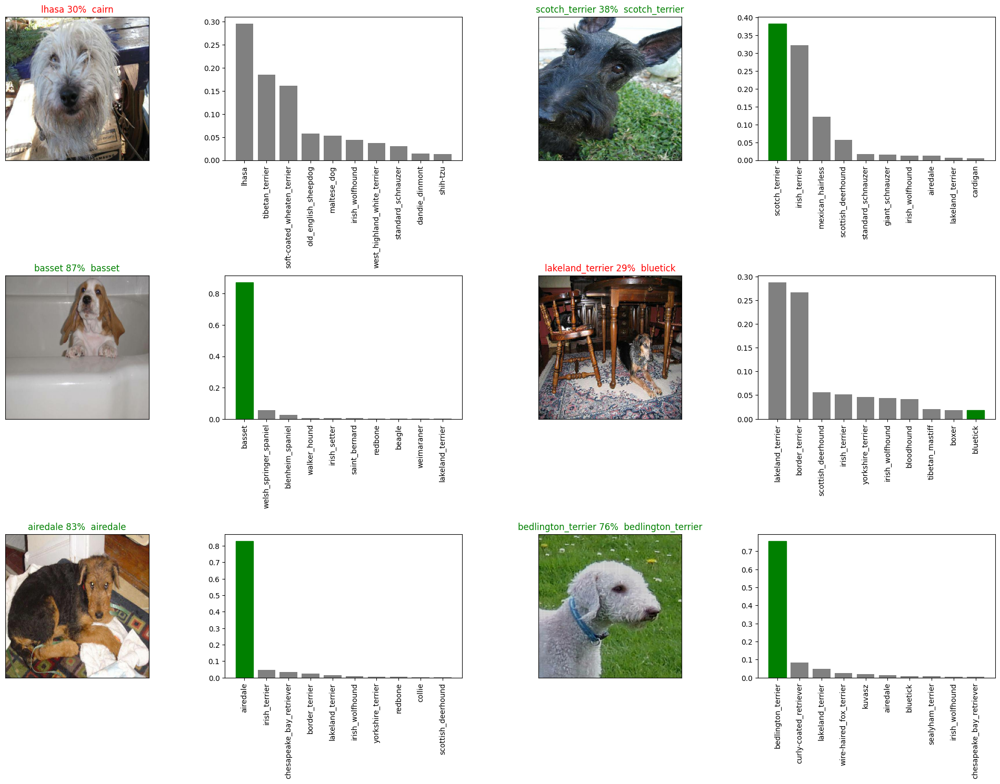

In [ ]:
i_multiplier= 0
num_rows = 3
num_cols=2
num_images= num_rows * num_cols
plt.figure(figsize=(10* num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(pred_probabilities= predictions,
            labels= val_labels,
            images= val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(pred_probabilities= predictions,
                 labels= val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
## Saving the model

In [ ]:
def save_model(model, suffix=None):

  modeldir= os.path.join("/content/drive/MyDrive/Dog-vision/models",
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path= modeldir + "-" + suffix + ".keras"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# def load_trained_model(model_path):
#   print(f"Loading saved model from: {model_path}")
#   model= load_model(model_path)
#   return model

In [ ]:
save_model(model, suffix= "1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog-vision/models/20250217-135416-1000-images-mobilenetv2-Adam.keras...


'/content/drive/MyDrive/Dog-vision/models/20250217-135416-1000-images-mobilenetv2-Adam.keras'

In [ ]:
from keras.models import load_model  # Import the correct function

def load_trained_model(model_path):  # Rename function to avoid recursion error
    print(f"Loading saved model from: {model_path}")
    model = load_model(model_path)  # Calls TensorFlow's load_model correctly
    return model

# Call the function
loaded_1000_image_model = load_trained_model("/content/drive/MyDrive/Dog-vision/models/20250217-135416-1000-images-mobilenetv2-Adam.keras")


Loading saved model from: /content/drive/MyDrive/Dog-vision/models/20250217-135416-1000-images-mobilenetv2-Adam.keras


In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 80s 12s/step - accuracy: 0.6512 - loss: 1.4068


[1.475001573562622, 0.6200000047683716]

In [ ]:
## Training a dog model on full dataset

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
from PIL import Image
import os

def remove_corrupt_images(image_paths, labels):
    clean_image_paths = []
    clean_labels = []

    for img_path, label in zip(image_paths, labels):
        try:
            # Try opening the image
            img = Image.open(img_path)
            img.verify()  # Verify image integrity
            clean_image_paths.append(img_path)
            clean_labels.append(label)
        except (IOError, SyntaxError):
            print(f"Corrupt file removed: {img_path}")

    return clean_image_paths, clean_labels

# Remove corrupted images before batching
X_clean, y_clean = remove_corrupt_images(X, y)

# Now create batches
full_data = create_data_batches(X_clean, y_clean)


Corrupt file removed: /content/drive/MyDrive/Dog-vision/train/38aaabf7675b60b866cb632ac65f2061.jpg
Corrupt file removed: /content/drive/MyDrive/Dog-vision/train/6887d854847cdc1bbbcc7529c0b93473.jpg
Corrupt file removed: /content/drive/MyDrive/Dog-vision/train/88fa6d0c6f8ce60ea125a86b183c5a15.jpg
Corrupt file removed: /content/drive/MyDrive/Dog-vision/train/a7f9839ac0a874686eb418d317eae284.jpg
Corrupt file removed: /content/drive/MyDrive/Dog-vision/train/ee024b9ec41146caca0fd51b4acad8c0.jpg
Creating validation data batches...


In [ ]:
# full_data= create_data_batches(X,y)
full_data

Creating validation data batches...


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model= build_model()

In [ ]:
full_model_tensorboard= create_tensorboard_callbavks()

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor= "accuracy",
                                                             patience=3)

In [ ]:
import os
print(os.path.exists("/content/drive/MyDrive/Dog-vision/train/a7f9839ac0a874686eb418d317eae284.jpg"))


False


In [ ]:
full_model.fit(x=full_data,
              epochs=NUM_EPOCHS,
              callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 50s 136ms/step - accuracy: 0.4337 - loss: 2.5417
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 75s 122ms/step - accuracy: 0.8304 - loss: 0.5834
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 123ms/step - accuracy: 0.9075 - loss: 0.3620
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - accuracy: 0.9414 - loss: 0.2553
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 122ms/step - accuracy: 0.9653 - loss: 0.1850
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 39s 121ms/step - accuracy: 0.9838 - loss: 0.1301
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - accuracy: 0.9897 - loss: 0.0988
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - accuracy: 0.9940 - loss: 0.0793
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - accuracy: 0.9963 - loss: 0.0613
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 45s 132ms/step - accuracy: 0.9969 - loss: 0.0512
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - accuracy: 0.9987 - loss: 0.0404
Epoch 12

In [ ]:
save_model(full_model, suffix= "full-dataset-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog-vision/models/20250218-124402-full-dataset-mobilenetv2-Adam.keras...


'/content/drive/MyDrive/Dog-vision/models/20250218-124402-full-dataset-mobilenetv2-Adam.keras'

## Making prediction on test dataset

In [ ]:
# test_path= "/content/drive/MyDrive/Dog-vision/test"
# test_filenames= [test_path + fname for fname in os.listdir(test_path)]
# test_filenames[:10]

['/content/drive/MyDrive/Dog-vision/teste60f6620bf8751538db9006d425f1b45.jpg',
 '/content/drive/MyDrive/Dog-vision/testdf0063da2179d3ac623296f2c164aeb6.jpg',
 '/content/drive/MyDrive/Dog-vision/testddbb53bb7ea7060847a0bd4554877e80.jpg',
 '/content/drive/MyDrive/Dog-vision/testdfe03aa0ae066e09cdda6e7f6e08390a.jpg',
 '/content/drive/MyDrive/Dog-vision/testddfbebe13aa8fba30f347c58466215df.jpg',
 '/content/drive/MyDrive/Dog-vision/teste726ac27864ecbde1f5822c4d6e26c17.jpg',
 '/content/drive/MyDrive/Dog-vision/teste0f9b92adbba451d296678f466732969.jpg',
 '/content/drive/MyDrive/Dog-vision/teste218c0da622fedc975a97999ad7d48a5.jpg',
 '/content/drive/MyDrive/Dog-vision/testde90fcd52b9c527ea097d88804985516.jpg',
 '/content/drive/MyDrive/Dog-vision/teste4e71046e4dce90d4b4790e9819d2d82.jpg']

In [ ]:
import os

test_path = "/content/drive/MyDrive/Dog-vision/test"

# Get all filenames with the correct path
test_filenames = [os.path.join(test_path, fname) for fname in os.listdir(test_path)]

# Remove missing or corrupted files before batching
def filter_missing_files(file_paths):
    valid_paths = [path for path in file_paths if os.path.exists(path)]
    removed_files = set(file_paths) - set(valid_paths)

    if removed_files:
        print(f" Removed {len(removed_files)} missing images.")

    return valid_paths

# Clean test filenames
test_filenames_clean = filter_missing_files(test_filenames)

test_data = create_data_batches(test_filenames_clean, test_data=True)



Creating test data batches...


In [ ]:
# test_data= create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
loaded_full_model=load_trained_model("/content/drive/MyDrive/Dog-vision/models/20250218-124402-full-dataset-mobilenetv2-Adam.keras")

Loading saved model from: /content/drive/MyDrive/Dog-vision/models/20250218-124402-full-dataset-mobilenetv2-Adam.keras


In [ ]:
test_predictions =loaded_full_model.predict(test_data, verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 473s 1s/step


In [ ]:
#save predictions to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Dog-vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
test_predictions= np.loadtxt("/content/drive/MyDrive/Dog-vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.10000842e-09, 3.56148594e-05, 4.78768136e-08, ...,
        3.10428644e-04, 2.43452547e-08, 1.31330795e-08],
       [8.20095920e-08, 1.80868334e-08, 4.34666632e-08, ...,
        3.55617509e-08, 5.60831904e-06, 8.01250862e-05],
       [3.28546186e-08, 1.56846924e-09, 1.25647039e-08, ...,
        2.89281325e-05, 2.03643071e-06, 6.58984800e-06],
       ...,
       [8.83969278e-06, 5.62503126e-12, 1.65866210e-10, ...,
        3.80686524e-11, 1.14555583e-07, 4.71873955e-06],
       [7.94932712e-04, 1.09883249e-05, 1.58979514e-11, ...,
        7.63491936e-09, 1.10396049e-05, 9.68597419e-07],
       [2.27768187e-08, 8.09382834e-13, 2.48346566e-07, ...,
        1.51889534e-09, 7.19585199e-12, 3.69676373e-10]])

# Preparing test dataset predictions for kaggle

In [ ]:
preds_df= pd.DataFrame(columns=["id"]+ list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
#Append test image ID's to predictions DataFrame
test_ids= [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]= test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e60f6620bf8751538db9006d425f1b45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,df0063da2179d3ac623296f2c164aeb6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ddbb53bb7ea7060847a0bd4554877e80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,dfe03aa0ae066e09cdda6e7f6e08390a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ddfbebe13aa8fba30f347c58466215df,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e60f6620bf8751538db9006d425f1b45,1.100008e-09,3.561486e-05,4.787681e-08,6.306433e-08,4.641842e-05,2.055279e-08,2.563246e-09,7.554016e-07,4.933635e-05,...,4.995834e-07,9.649469e-09,1.682357e-07,1.972476e-03,8.325799e-04,8.697128e-08,1.283692e-05,3.104286e-04,2.434525e-08,1.313308e-08
1,df0063da2179d3ac623296f2c164aeb6,8.200959e-08,1.808683e-08,4.346666e-08,2.961845e-09,1.537768e-07,8.153612e-03,3.013146e-04,2.923314e-03,6.057758e-07,...,1.075329e-05,1.282673e-04,2.889114e-09,3.114672e-06,1.434502e-09,2.030043e-04,3.703955e-05,3.556175e-08,5.608319e-06,8.012509e-05
2,ddbb53bb7ea7060847a0bd4554877e80,3.285462e-08,1.568469e-09,1.256470e-08,1.988602e-08,1.204922e-05,2.860739e-07,1.775871e-06,8.863286e-01,1.072369e-05,...,2.256172e-05,4.704567e-07,5.248019e-05,7.863642e-06,2.424569e-07,3.004533e-06,4.099023e-07,2.892813e-05,2.036431e-06,6.589848e-06
3,dfe03aa0ae066e09cdda6e7f6e08390a,3.076416e-08,1.525267e-05,1.165822e-04,2.610379e-07,1.479437e-08,6.406948e-08,1.040152e-08,3.569151e-06,1.873092e-06,...,1.430091e-07,1.356114e-09,6.357334e-11,9.874051e-09,7.503132e-09,3.938738e-08,6.285316e-08,3.071008e-06,3.698726e-08,4.111511e-05
4,ddfbebe13aa8fba30f347c58466215df,9.248829e-12,5.542222e-11,1.640599e-10,1.658483e-08,9.930292e-06,4.793031e-03,1.064623e-08,1.364320e-04,1.126445e-02,...,4.631477e-07,5.461564e-08,1.482324e-10,3.593586e-03,1.066574e-08,2.289660e-05,4.313155e-09,4.224442e-09,2.180050e-06,1.559752e-08


In [ ]:
preds_df.to_csv("/content/drive/MyDrive/Dog-vision/full_model_preds_submission_1_mobilenetV2.csv", index= False)

#Making Predictions on custom data

In [ ]:
custom_path="/content/drive/MyDrive/Dog-vision/myDogPhotos/"
custom_images_paths= [os.path.join(custom_path, fname) for fname in os.listdir(custom_path)]
custom_images_paths


['/content/drive/MyDrive/Dog-vision/myDogPhotos/dog2.jpg',
 '/content/drive/MyDrive/Dog-vision/myDogPhotos/dog3.jpg',
 '/content/drive/MyDrive/Dog-vision/myDogPhotos/dog1.jpg']

In [ ]:
custom_data= create_data_batches(custom_images_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
custom_preds =loaded_full_model.predict(custom_data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
custom_pred_labels =[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['pembroke', 'collie', 'toy_poodle']

In [ ]:
custom_images= []

for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

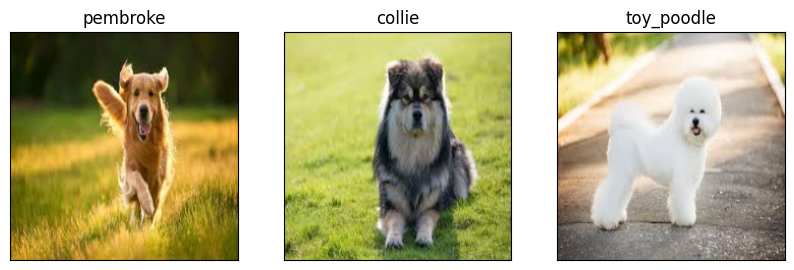

In [ ]:
plt.figure(figsize=(10,10))

for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)